# 🚨 Disaster Response Object Detection with YOLOv8n

**Task**: Object Detection for Disaster Response  
**Model**: YOLOv8 Nano (YOLOv8n)  
**Framework**: Ultralytics  
**Classes**: Person, Fire, Smoke, Small Vehicle, Large Vehicle, Two-Wheeler  

**Pipeline**:  
Dataset → YOLO-format annotations → YOLOv8n training → validation → test image → bounding-box detection → Precision/Recall/mAP  

**Target Accuracy**: >90% mAP

---

## 1. Import Libraries

In [1]:
import os
import yaml
import glob
import random
import shutil
from pathlib import Path
from collections import Counter

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from PIL import Image

from ultralytics import YOLO

# Settings
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12
sns.set_style('whitegrid')

print('All libraries imported successfully!')

All libraries imported successfully!


In [2]:
import sys
import torch

print("Python:", sys.executable)
print("PyTorch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None")

Python: d:\Projects\Dp Learning\.venv\Scripts\python.exe
PyTorch: 2.14.0+cu130
CUDA: True
GPU: NVIDIA GeForce RTX 2050


## 2. Download the Dataset

In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("rupankarmajumdar/disaster-response-object-detection-dataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1


## 3. Explore the Dataset Structure

In [4]:
# Walk through the dataset directory to understand its structure
dataset_path = Path(path)

print(f"Dataset root: {dataset_path}")
print("\n📁 Directory Structure:")
print("=" * 60)

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(str(dataset_path), '').count(os.sep)
    indent = ' ' * 2 * level
    print(f'{indent}📂 {os.path.basename(root)}/')
    sub_indent = ' ' * 2 * (level + 1)
    # Show a limited number of files
    file_count = len(files)
    for f in files[:5]:
        print(f'{sub_indent}📄 {f}')
    if file_count > 5:
        print(f'{sub_indent}... and {file_count - 5} more files')

Dataset root: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1

📁 Directory Structure:
📂 1/
  📄 data.yaml
  📂 test/
    📂 images/
      📄 1.jpg
      📄 10.jpg
      📄 100.jpg
      📄 101.jpg
      📄 102.jpg
      ... and 429 more files
    📂 labels/
      📄 1.txt
      📄 10.txt
      📄 100.txt
      📄 101.txt
      📄 102.txt
      ... and 429 more files
  📂 train/
    📂 images/
      📄 1.jpg
      📄 10.jpg
      📄 10000.jpg
      📄 10002.jpg
      📄 10004.jpg
      ... and 10445 more files
    📂 labels/
      📄 1-56.txt
      📄 1.txt
      📄 10.txt
      📄 10000.txt
      📄 10002.txt
      ... and 10445 more files
  📂 val/
    📂 images/
      📄 1.jpg
      📄 10.jpg
      📄 100.jpg
      📄 1000.jpg
      📄 1001.jpg
      ... and 1551 more files
    📂 labels/
      📄 1.txt
      📄 10.txt
      📄 100.txt
      📄 1000.txt
      📄 1001.txt
      ... and 1551 more files


In [5]:
# Find and load data.yaml from the original dataset, then use the reduced copy.
yaml_files = list(dataset_path.rglob('data.yaml')) + list(dataset_path.rglob('*.yaml'))
print('Found YAML files in the reduced dataset root:')
for y in yaml_files:
    print(' ', y)

# Load the first yaml file found in the reduced dataset; if not present, build one.
if yaml_files:
    yaml_path = yaml_files[0]
    print(f'\nUsing: {yaml_path}')
    with open(yaml_path, 'r') as f:
        data_config = yaml.safe_load(f)
else:
    data_config = {}
    yaml_path = dataset_path / 'data.yaml'
    print(f'\nNo data.yaml found yet. Will create one in: {yaml_path}')

print('\n📋 data.yaml contents:')
print('=' * 60)
if data_config:
    for key, value in data_config.items():
        print(f'  {key}: {value}')
else:
    print('  (not found yet)')


Found YAML files in the reduced dataset root:
  C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1\data.yaml
  C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1\data.yaml

Using: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1\data.yaml

📋 data.yaml contents:
  train: ../train/images
  val: ../val/images
  test: ../test/images
  nc: 6
  names: ['person', 'fire', 'smoke', 'small_vehicle', 'large_vehicle', 'two_wheeler']


In [6]:
# Extract class names and count from the reduced dataset's YAML if available.
# This preserves all original disaster labels as much as possible.
class_names = data_config.get('names', {})
num_classes = data_config.get('nc', len(class_names))

if isinstance(class_names, list):
    class_dict = {i: name for i, name in enumerate(class_names)}
else:
    class_dict = class_names

# If YAML is missing or incomplete, fall back to the original class labels already seen.
if not class_dict:
    class_dict = {
        0: 'Person',
        1: 'Fire',
        2: 'Smoke',
        3: 'Small Vehicle',
        4: 'Large Vehicle',
        5: 'Two-Wheeler'
    }
    num_classes = len(class_dict)

print(f'Number of classes: {num_classes}')
print('\n🏷️ Class Mapping:')
for idx, name in class_dict.items():
    print(f'  {idx}: {name}')


Number of classes: 6

🏷️ Class Mapping:
  0: person
  1: fire
  2: smoke
  3: small_vehicle
  4: large_vehicle
  5: two_wheeler


In [7]:
# Create a reduced copy of the existing YOLO dataset without modifying the original.
# Requirement: exactly 1,000 images total = 700 train + 200 valid + 100 test.

def find_split_dirs(base_path):
    """Find train/valid/val/test directories in a YOLO dataset."""
    splits = {}
    for split_name in ['train', 'valid', 'val', 'test']:
        for candidate in base_path.rglob(split_name):
            if candidate.is_dir():
                splits[split_name] = candidate
                break
    return splits


def collect_yolo_pairs(split_dir):
    """Return image/label pairs from a split directory."""
    images_dir = split_dir / 'images' if (split_dir / 'images').exists() else split_dir
    labels_dir = split_dir / 'labels' if (split_dir / 'labels').exists() else split_dir

    image_files = []
    for ext in ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tif', '*.tiff']:
        image_files.extend(images_dir.glob(ext))
    image_files = sorted(set(image_files))

    pairs = []
    for img_path in image_files:
        label_candidates = [
            labels_dir / f'{img_path.stem}.txt',
            labels_dir / f'{img_path.name.replace(img_path.suffix, ".txt")}',
            img_path.with_suffix('.txt')
        ]
        label_path = next((p for p in label_candidates if p.exists()), None)
        if label_path is not None:
            pairs.append((img_path, label_path))
    return pairs


split_dirs = find_split_dirs(dataset_path)
print('Original dataset split directories:')
for key, value in split_dirs.items():
    print(f'  {key}: {value}')

# Create the reduced dataset under a new folder, leaving the original dataset intact.
small_root = dataset_path.parent / 'disaster_small'
if small_root.exists():
    shutil.rmtree(small_root)
small_root.mkdir(parents=True, exist_ok=True)

rng = random.Random(42)
requested_split_sizes = {'train': 700, 'valid': 200, 'test': 100}
source_candidates = {'train': ['train'], 'valid': ['valid', 'val'], 'test': ['test']}

for split_name, target_count in requested_split_sizes.items():
    source_key = None
    for candidate in source_candidates[split_name]:
        if candidate in split_dirs:
            source_key = candidate
            break

    if source_key is None:
        raise FileNotFoundError(f"No source split found for '{split_name}' in the original dataset.")

    source_split = split_dirs[source_key]
    source_pairs = collect_yolo_pairs(source_split)
    if len(source_pairs) < target_count:
        raise ValueError(f"Original '{source_key}' split only has {len(source_pairs)} image-label pairs; need {target_count}.")

    selected_pairs = rng.sample(source_pairs, target_count)
    dest_split_dir = small_root / split_name
    (dest_split_dir / 'images').mkdir(parents=True, exist_ok=True)
    (dest_split_dir / 'labels').mkdir(parents=True, exist_ok=True)

    for img_path, label_path in selected_pairs:
        shutil.copy2(img_path, dest_split_dir / 'images' / img_path.name)
        shutil.copy2(label_path, dest_split_dir / 'labels' / label_path.name)

    print(f'Created {split_name}: {len(selected_pairs)} image-label pairs')

# Point the rest of the notebook to the reduced dataset.
dataset_path = small_root
split_dirs = find_split_dirs(dataset_path)
print('\n✅ Reduced dataset created successfully:')
print(f'  Root: {dataset_path}')
for key, value in split_dirs.items():
    print(f'  {key}: {len(list((value / "images").glob("*")))} images')


Original dataset split directories:
  train: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1\train
  val: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1\val
  test: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\1\test
Created train: 700 image-label pairs
Created valid: 200 image-label pairs
Created test: 100 image-label pairs

✅ Reduced dataset created successfully:
  Root: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\disaster_small
  train: 700 images
  valid: 200 images
  test: 100 images


In [8]:
# Count images and labels in each split
print("\n📊 Dataset Statistics:")
print("=" * 60)

split_stats = {}
for split_name, split_dir in split_dirs.items():
    images_dir = split_dir / 'images'
    labels_dir = split_dir / 'labels'
    
    if not images_dir.exists():
        images_dir = split_dir  # images might be directly in the split folder
    if not labels_dir.exists():
        labels_dir = split_dir
    
    img_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tif', '*.tiff']
    images = []
    for ext in img_extensions:
        images.extend(list(images_dir.glob(ext)))
    
    labels = list(labels_dir.glob('*.txt'))
    # Exclude classes.txt if present
    labels = [l for l in labels if l.name != 'classes.txt']
    
    split_stats[split_name] = {'images': len(images), 'labels': len(labels),
                                'images_dir': images_dir, 'labels_dir': labels_dir}
    print(f"  {split_name:>8s}: {len(images):5d} images, {len(labels):5d} labels")

total_images = sum(s['images'] for s in split_stats.values())
total_labels = sum(s['labels'] for s in split_stats.values())
print(f"  {'TOTAL':>8s}: {total_images:5d} images, {total_labels:5d} labels")


📊 Dataset Statistics:
     train:   700 images,   700 labels
     valid:   200 images,   200 labels
      test:   100 images,   100 labels
     TOTAL:  1000 images,  1000 labels


## 4. Analyze Class Distribution

In [9]:
# Parse all label files to get class distribution
def parse_labels(labels_dir):
    """Parse YOLO format label files and return class counts and bbox info."""
    class_counts = Counter()
    bbox_data = []
    
    label_files = list(labels_dir.glob('*.txt'))
    label_files = [l for l in label_files if l.name != 'classes.txt']
    
    for label_file in label_files:
        with open(label_file, 'r') as f:
            lines = f.readlines()
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:5])
                class_counts[cls_id] += 1
                bbox_data.append({
                    'class_id': cls_id,
                    'x_center': x_center,
                    'y_center': y_center,
                    'width': width,
                    'height': height,
                    'area': width * height,
                    'file': label_file.stem
                })
    
    return class_counts, bbox_data

# Aggregate across all splits
total_class_counts = Counter()
all_bbox_data = []
split_class_counts = {}

for split_name, stats in split_stats.items():
    counts, bboxes = parse_labels(stats['labels_dir'])
    total_class_counts += counts
    all_bbox_data.extend(bboxes)
    split_class_counts[split_name] = counts

print("\n🏷️ Overall Class Distribution:")
print("=" * 50)
total_annotations = sum(total_class_counts.values())
for cls_id in sorted(total_class_counts.keys()):
    name = class_dict.get(cls_id, f'class_{cls_id}')
    count = total_class_counts[cls_id]
    pct = (count / total_annotations) * 100
    bar = '█' * int(pct / 2)
    print(f"  {cls_id} - {name:>15s}: {count:5d} ({pct:5.1f}%) {bar}")
print(f"  {'TOTAL':>19s}: {total_annotations:5d}")


🏷️ Overall Class Distribution:
  0 -          person:   393 ( 23.9%) ███████████
  1 -            fire:   483 ( 29.4%) ██████████████
  2 -           smoke:   116 (  7.1%) ███
  3 -   small_vehicle:   256 ( 15.6%) ███████
  4 -   large_vehicle:   181 ( 11.0%) █████
  5 -     two_wheeler:   215 ( 13.1%) ██████
                TOTAL:  1644


C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2244316543.py:23: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()
d:\Projects\Dp Learning\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


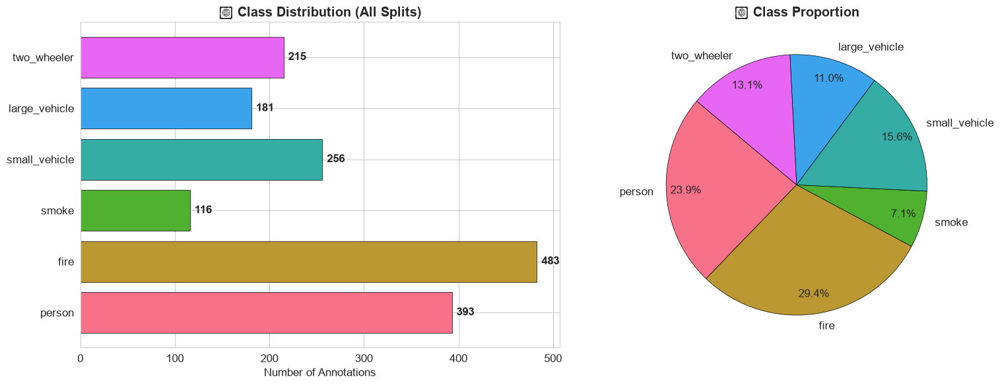

✅ Saved: class_distribution.png


In [10]:
# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
sorted_classes = sorted(total_class_counts.keys())
names = [class_dict.get(i, f'class_{i}') for i in sorted_classes]
counts = [total_class_counts[i] for i in sorted_classes]
colors = sns.color_palette('husl', len(sorted_classes))

bars = axes[0].barh(names, counts, color=colors, edgecolor='black', linewidth=0.5)
axes[0].set_xlabel('Number of Annotations')
axes[0].set_title('📊 Class Distribution (All Splits)', fontweight='bold')
for bar, count in zip(bars, counts):
    axes[0].text(bar.get_width() + max(counts)*0.01, bar.get_y() + bar.get_height()/2,
                 f'{count}', va='center', fontweight='bold')

# Pie chart
axes[1].pie(counts, labels=names, colors=colors, autopct='%1.1f%%',
            startangle=140, pctdistance=0.85,
            wedgeprops=dict(edgecolor='black', linewidth=0.5))
axes[1].set_title('📊 Class Proportion', fontweight='bold')

plt.tight_layout()
plt.show()
print("✅ Saved: class_distribution.png")

C:\Users\santo\AppData\Local\Temp\ipykernel_12796\3347529602.py:17: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()


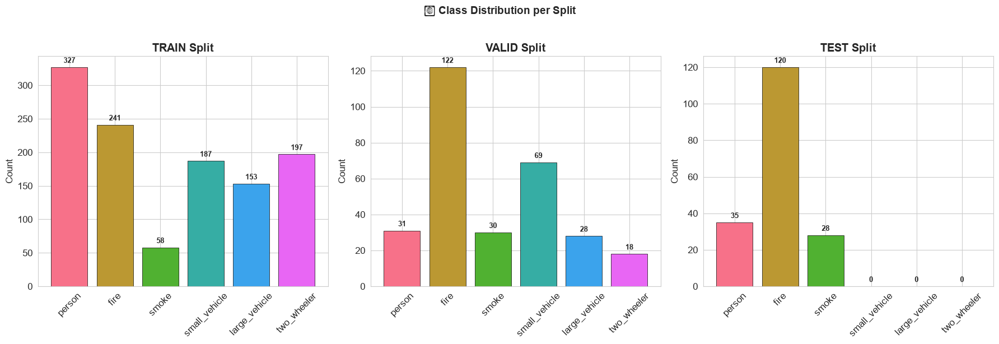

In [11]:
# Per-split class distribution
fig, axes = plt.subplots(1, len(split_class_counts), figsize=(6*len(split_class_counts), 6))
if len(split_class_counts) == 1:
    axes = [axes]

for ax, (split_name, counts) in zip(axes, split_class_counts.items()):
    names_split = [class_dict.get(i, f'class_{i}') for i in sorted_classes]
    vals = [counts.get(i, 0) for i in sorted_classes]
    ax.bar(names_split, vals, color=colors, edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split_name.upper()} Split', fontweight='bold')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45)
    for j, v in enumerate(vals):
        ax.text(j, v + max(vals)*0.02, str(v), ha='center', fontsize=9, fontweight='bold')

plt.suptitle('📊 Class Distribution per Split', fontweight='bold', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## 5. Analyze Bounding Box Statistics

In [12]:
# Bounding box size analysis
bbox_df = pd.DataFrame(all_bbox_data)
bbox_df['class_name'] = bbox_df['class_id'].map(class_dict)

print("📏 Bounding Box Statistics:")
print("=" * 60)
print(bbox_df.groupby('class_name')[['width', 'height', 'area']].describe().round(4))

📏 Bounding Box Statistics:
               width                                                          \
               count    mean     std     min     25%     50%     75%     max   
class_name                                                                     
fire           483.0  0.2272  0.2055  0.0250  0.0707  0.1619  0.3012  1.0000   
large_vehicle  181.0  0.6346  0.2510  0.0375  0.4824  0.6960  0.8213  1.0000   
person         393.0  0.2850  0.1443  0.0344  0.1750  0.2578  0.3703  0.8305   
small_vehicle  256.0  0.5471  0.2939  0.0594  0.2739  0.5397  0.8213  1.0000   
smoke          116.0  0.5308  0.2704  0.0400  0.2899  0.5410  0.7660  1.0000   
two_wheeler    215.0  0.5180  0.2920  0.0410  0.2602  0.5457  0.7590  1.0000   

              height          ...                   area                  \
               count    mean  ...     75%     max  count    mean     std   
class_name                    ...                                          
fire           483.0  0.

C:\Users\santo\AppData\Local\Temp\ipykernel_12796\3844660723.py:31: UserWarning: Glyph 128207 (\N{STRAIGHT RULER}) missing from font(s) Arial.
  plt.tight_layout()
d:\Projects\Dp Learning\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 128207 (\N{STRAIGHT RULER}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


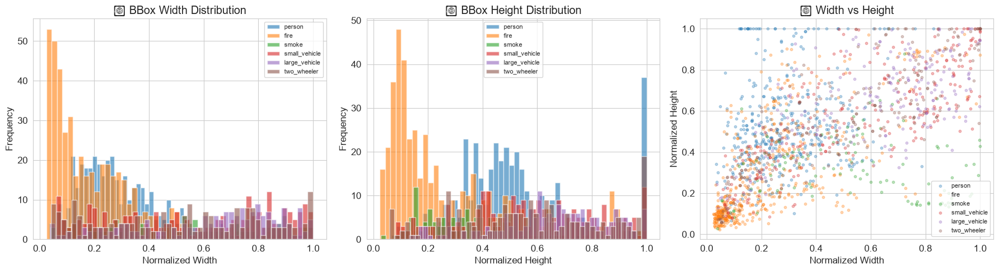

In [13]:
# Visualize bbox dimensions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Width distribution
for cls_id in sorted_classes:
    subset = bbox_df[bbox_df['class_id'] == cls_id]
    axes[0].hist(subset['width'], bins=50, alpha=0.6, label=class_dict[cls_id])
axes[0].set_xlabel('Normalized Width')
axes[0].set_ylabel('Frequency')
axes[0].set_title('📏 BBox Width Distribution')
axes[0].legend(fontsize=8)

# Height distribution
for cls_id in sorted_classes:
    subset = bbox_df[bbox_df['class_id'] == cls_id]
    axes[1].hist(subset['height'], bins=50, alpha=0.6, label=class_dict[cls_id])
axes[1].set_xlabel('Normalized Height')
axes[1].set_ylabel('Frequency')
axes[1].set_title('📏 BBox Height Distribution')
axes[1].legend(fontsize=8)

# Scatter: Width vs Height
for cls_id in sorted_classes:
    subset = bbox_df[bbox_df['class_id'] == cls_id]
    axes[2].scatter(subset['width'], subset['height'], alpha=0.3, s=10, label=class_dict[cls_id])
axes[2].set_xlabel('Normalized Width')
axes[2].set_ylabel('Normalized Height')
axes[2].set_title('📏 Width vs Height')
axes[2].legend(fontsize=8)

plt.tight_layout()
plt.show()

## 6. Visualize Sample Images with Annotations

In [14]:
# Define colors for each class
CLASS_COLORS = {
    0: (255, 0, 0),       # Person - Red
    1: (255, 165, 0),     # Fire - Orange
    2: (128, 128, 128),   # Smoke - Gray
    3: (0, 255, 0),       # Small Vehicle - Green
    4: (0, 0, 255),       # Large Vehicle - Blue
    5: (255, 255, 0),     # Two-Wheeler - Yellow
}

def draw_yolo_bboxes(image_path, label_path, class_dict, class_colors):
    """Draw YOLO bounding boxes on an image."""
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    if label_path.exists():
        with open(label_path, 'r') as f:
            lines = f.readlines()
        
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls_id = int(parts[0])
                x_center, y_center, bw, bh = map(float, parts[1:5])
                
                # Convert normalized to pixel coords
                x1 = int((x_center - bw / 2) * w)
                y1 = int((y_center - bh / 2) * h)
                x2 = int((x_center + bw / 2) * w)
                y2 = int((y_center + bh / 2) * h)
                
                color = class_colors.get(cls_id, (255, 255, 255))
                cls_name = class_dict.get(cls_id, f'class_{cls_id}')
                
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                # Label background
                (tw, th), _ = cv2.getTextSize(cls_name, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)
                cv2.rectangle(img, (x1, y1 - th - 8), (x1 + tw + 4, y1), color, -1)
                cv2.putText(img, cls_name, (x1 + 2, y1 - 4),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1)
    
    return img

print("✅ Visualization function defined.")

✅ Visualization function defined.


C:\Users\santo\AppData\Local\Temp\ipykernel_12796\3344584137.py:31: UserWarning: Glyph 128248 (\N{CAMERA WITH FLASH}) missing from font(s) Arial.
  plt.tight_layout()
d:\Projects\Dp Learning\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 128248 (\N{CAMERA WITH FLASH}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


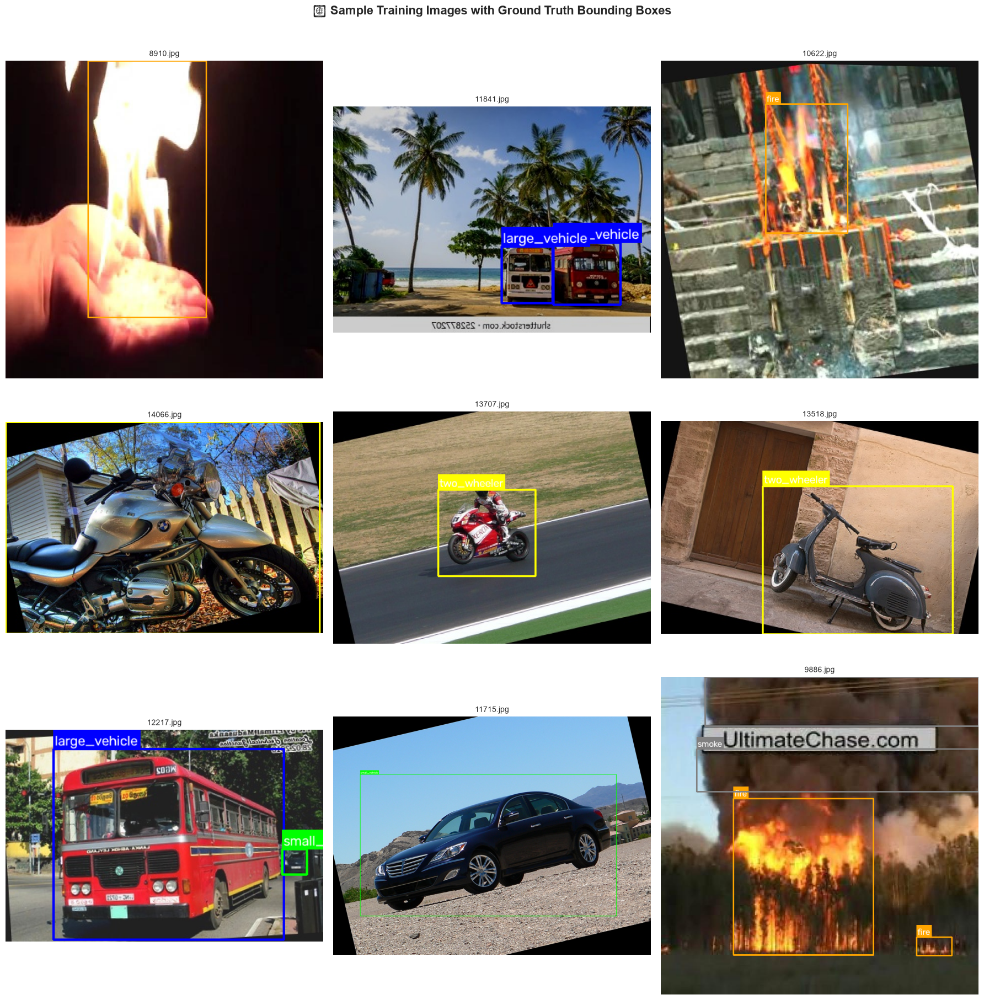

In [15]:
# Show sample images from training set with ground truth bboxes
train_key = 'train'
images_dir = split_stats[train_key]['images_dir']
labels_dir = split_stats[train_key]['labels_dir']

img_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
all_images = []
for ext in img_extensions:
    all_images.extend(list(images_dir.glob(ext)))

# Pick random samples
random.seed(42)
sample_images = random.sample(all_images, min(9, len(all_images)))

fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes = axes.flatten()

for idx, img_path in enumerate(sample_images):
    label_path = labels_dir / (img_path.stem + '.txt')
    annotated_img = draw_yolo_bboxes(img_path, label_path, class_dict, CLASS_COLORS)
    axes[idx].imshow(annotated_img)
    axes[idx].set_title(img_path.name, fontsize=10)
    axes[idx].axis('off')

# Hide unused subplots
for idx in range(len(sample_images), len(axes)):
    axes[idx].axis('off')

plt.suptitle('📸 Sample Training Images with Ground Truth Bounding Boxes',
             fontweight='bold', fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

## 7. Prepare data.yaml for Training

We need to ensure the paths in `data.yaml` point to the correct absolute paths on this machine.

In [16]:
# Create the required data.yaml for the reduced dataset.
# This keeps the original dataset untouched and makes the small dataset trainable.

small_root = dataset_path.parent / 'disaster_small'
small_train_dir = small_root / 'train'
small_val_dir = small_root / 'valid'
small_test_dir = small_root / 'test'

for split_dir in [small_train_dir, small_val_dir, small_test_dir]:
    (split_dir / 'images').mkdir(parents=True, exist_ok=True)
    (split_dir / 'labels').mkdir(parents=True, exist_ok=True)

small_yaml = {
    'path': str(small_root),
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': num_classes,
    'names': class_dict if isinstance(class_dict, dict) else {i: n for i, n in enumerate(class_dict)}
}

small_yaml_path = small_root / 'data.yaml'
with open(small_yaml_path, 'w') as f:
    yaml.dump(small_yaml, f, default_flow_style=False, sort_keys=False)

print('✅ Created reduced dataset YAML:')
print('=' * 60)
print(small_yaml_path)
with open(small_yaml_path, 'r') as f:
    print(f.read())

custom_yaml_path = small_yaml_path


✅ Created reduced dataset YAML:
C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\disaster_small\data.yaml
path: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\disaster_small
train: train/images
val: valid/images
test: test/images
nc: 6
names:
  0: person
  1: fire
  2: smoke
  3: small_vehicle
  4: large_vehicle
  5: two_wheeler



## 8. Train YOLOv8n Model

Training configuration optimized for disaster detection with target mAP >90%:
- **Model**: YOLOv8n (Nano) — fast yet accurate
- **Epochs**: 100 (with early stopping patience=20)
- **Image Size**: 640×640
- **Augmentation**: Enabled (mosaic, mixup, etc.)

In [17]:
# Load pretrained YOLOv8n model
model = YOLO('yolov8n.pt')  # Downloads pretrained weights automatically

print(f"✅ Model loaded: YOLOv8n")
print(f"   Parameters: {sum(p.numel() for p in model.model.parameters()):,}")
print(f"   Architecture: {model.model.__class__.__name__}")

✅ Model loaded: YOLOv8n
   Parameters: 3,157,200
   Architecture: DetectionModel


In [18]:
# Train the model on the reduced dataset.
# Use CPU automatically if no CUDA GPU is available.
results = model.train(
    data=str(custom_yaml_path),
    epochs=20,
    imgsz=640,
    batch=8,
    patience=10,
    save=True,
    save_period=5,
    device=0,
    workers=2,
    project='disaster_detection_small',
    name='yolov8n_disaster_small',
    exist_ok=True,
    pretrained=True,
    optimizer='auto',
    lr0=0.01,
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=2.0,
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,
    box=7.5,
    cls=0.5,
    dfl=1.5,
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=0.0,
    translate=0.1,
    scale=0.5,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.1,
    copy_paste=0.0,
    verbose=True,
)

print("\n✅ Training Complete!")

Ultralytics 8.4.138  Python-3.13.3 torch-2.14.0+cu130 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\disaster_small\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.

## 9. Training Results Analysis

In [19]:
# Find the training output directory
# Ultralytics saves runs under the 'runs/detect' structure, but the working directory
# of the notebook can differ from the project root. Search from multiple valid roots.
search_roots = []
for base in [
    Path.cwd(),
    Path.cwd().parent,
    Path('D:/Projects/Dp Learning'),
    Path(r'D:\Projects\Dp Learning'),
]:
    try:
        if base.exists():
            search_roots.append(base)
    except Exception:
        pass

train_dir = None
for root in search_roots:
    direct = root / 'runs' / 'detect' / 'disaster_detection_small' / 'yolov8n_disaster_small'
    if direct.exists():
        train_dir = direct
        break

if train_dir is None:
    for root in search_roots:
        candidate_dirs = sorted(root.glob('**/yolov8n_disaster_small'))
        if candidate_dirs:
            train_dir = candidate_dirs[-1]
            break

if train_dir is None:
    for root in search_roots:
        candidate_dirs = sorted(root.glob('**/yolov8n_disaster*'))
        if candidate_dirs:
            train_dir = candidate_dirs[-1]
            break

if train_dir is None:
    for root in search_roots:
        csv_matches = sorted(root.glob('**/results.csv'))
        if csv_matches:
            train_dir = csv_matches[0].parent
            break

if train_dir is None or not train_dir.exists():
    raise FileNotFoundError(
        "Training output folder not found. Run training first or check the project/name settings. "
        f"Current working directory: {Path.cwd()}"
    )

print("📁 Training output directory:")
print(train_dir)
for item in sorted(train_dir.iterdir()):
    if item.is_file():
        print(f"  📄 {item.name} ({item.stat().st_size / 1024:.1f} KB)")
    else:
        print(f"  📂 {item.name}/")

📁 Training output directory:
D:\Projects\Dp Learning\runs\detect\disaster_detection_small\yolov8n_disaster_small
  📄 BoxF1_curve.png (260.7 KB)
  📄 BoxP_curve.png (246.5 KB)
  📄 BoxPR_curve.png (150.6 KB)
  📄 BoxR_curve.png (215.2 KB)
  📄 confusion_matrix.png (151.5 KB)
  📄 confusion_matrix_normalized.png (172.1 KB)
  📄 results.csv (0.5 KB)
  📄 results.png (269.4 KB)
  📄 val_batch0_labels.jpg (470.5 KB)
  📄 val_batch0_pred.jpg (477.2 KB)
  📄 val_batch1_labels.jpg (500.3 KB)
  📄 val_batch1_pred.jpg (506.3 KB)
  📄 val_batch2_labels.jpg (494.6 KB)
  📄 val_batch2_pred.jpg (502.0 KB)
  📂 weights/


C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2499580059.py:9: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
d:\Projects\Dp Learning\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


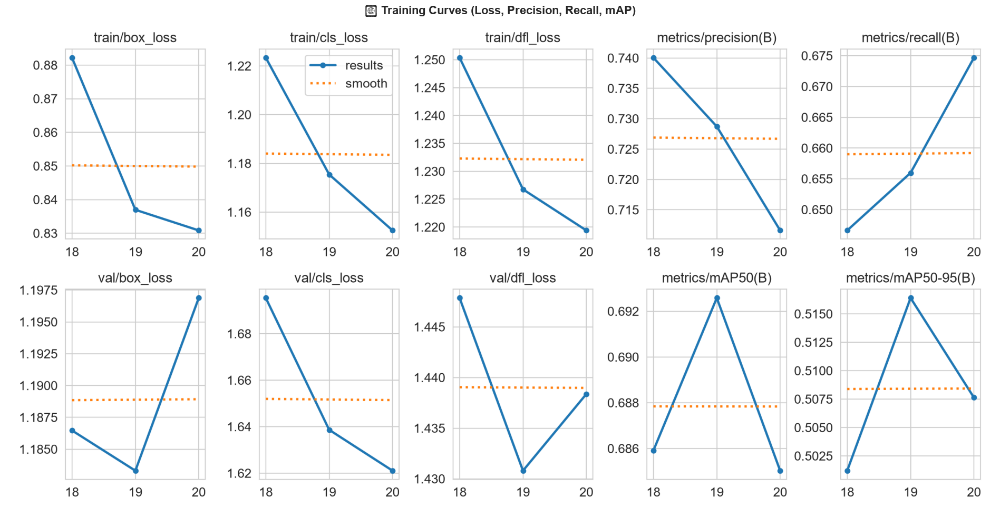

In [20]:
# Display training curves generated by Ultralytics
results_img = train_dir / 'results.png'
if results_img.exists():
    img = Image.open(results_img)
    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    ax.imshow(img)
    ax.axis('off')
    ax.set_title('📈 Training Curves (Loss, Precision, Recall, mAP)', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ results.png not found. Training may still be in progress.")

In [21]:
# Parse and plot training metrics from results.csv
results_csv = train_dir / 'results.csv'
if results_csv.exists():
    df_results = pd.read_csv(results_csv)
    df_results.columns = df_results.columns.str.strip()  # Remove whitespace from column names
    
    print("📋 Training Results Columns:")
    print(df_results.columns.tolist())
    print(f"\nTotal epochs trained: {len(df_results)}")
    
    # Display last few rows
    print("\n📊 Last 5 Epochs:")
    display(df_results.tail())
else:
    print("⚠️ results.csv not found.")

📋 Training Results Columns:
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']

Total epochs trained: 3

📊 Last 5 Epochs:


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,18,1683.61,0.88220,1.22338,1.25037,0.74005,0.64662,0.68591,0.50120,1.18647,1.69537,1.44785,0.000159,0.000159,0.000159
1,19,1774.36,0.83697,1.17543,1.22676,0.72872,0.65597,0.69258,0.51640,1.18331,1.63864,1.43080,0.000109,0.000109,0.000109
2,20,1864.29,0.83084,1.15247,1.21939,0.71161,0.67468,0.68503,0.50763,1.19688,1.62106,1.43837,0.000060,0.000060,0.000060


C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2899199477.py:84: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2899199477.py:84: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2899199477.py:84: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2899199477.py:85: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) Arial.
  plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
C:\Users\santo\AppData\Local\Temp\ipykernel_12796\2899199477.py:85: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
C:\Users\santo\AppData\Local\Temp\ipykernel_12796

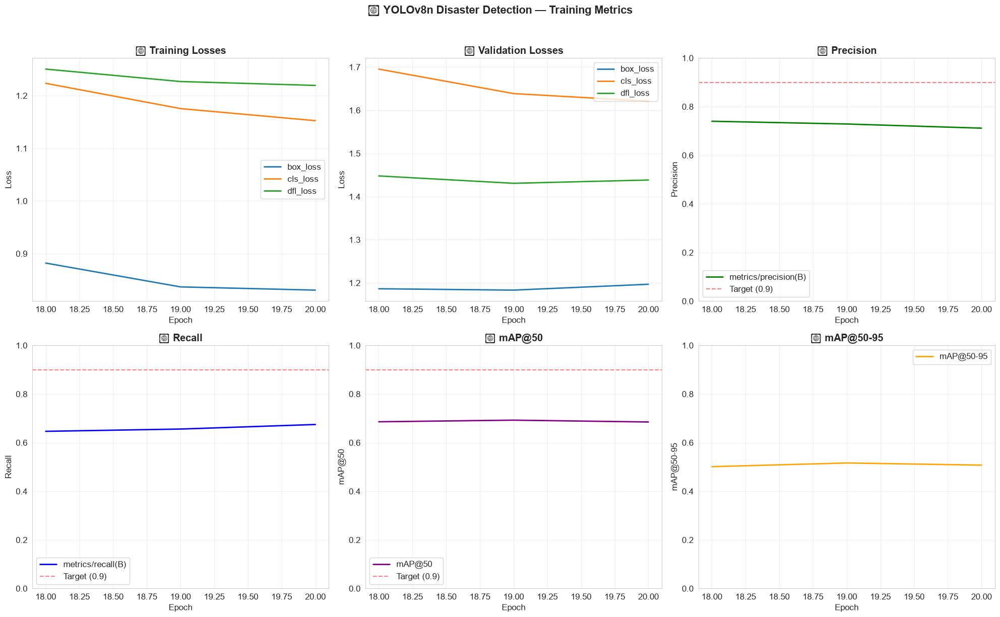

✅ Saved: training_curves.png


In [22]:
# Custom training curves
if results_csv.exists():
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    # Loss curves
    loss_cols = [c for c in df_results.columns if 'loss' in c.lower()]
    for col in loss_cols:
        if 'train' in col.lower() or 'box' in col.lower():
            ax_idx = 0
        elif 'val' in col.lower():
            ax_idx = 1
        else:
            ax_idx = 0
    
    # Train losses
    train_loss_cols = [c for c in df_results.columns if 'train' in c.lower() and 'loss' in c.lower()]
    for col in train_loss_cols:
        axes[0, 0].plot(df_results['epoch'], df_results[col], label=col.replace('train/', ''), linewidth=2)
    axes[0, 0].set_title('📉 Training Losses', fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Validation losses
    val_loss_cols = [c for c in df_results.columns if 'val' in c.lower() and 'loss' in c.lower()]
    for col in val_loss_cols:
        axes[0, 1].plot(df_results['epoch'], df_results[col], label=col.replace('val/', ''), linewidth=2)
    axes[0, 1].set_title('📉 Validation Losses', fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # Precision
    prec_cols = [c for c in df_results.columns if 'precision' in c.lower()]
    for col in prec_cols:
        axes[0, 2].plot(df_results['epoch'], df_results[col], label=col, linewidth=2, color='green')
    axes[0, 2].set_title('📈 Precision', fontweight='bold')
    axes[0, 2].set_xlabel('Epoch')
    axes[0, 2].set_ylabel('Precision')
    axes[0, 2].set_ylim([0, 1])
    axes[0, 2].axhline(y=0.9, color='r', linestyle='--', alpha=0.5, label='Target (0.9)')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)
    
    # Recall
    recall_cols = [c for c in df_results.columns if 'recall' in c.lower()]
    for col in recall_cols:
        axes[1, 0].plot(df_results['epoch'], df_results[col], label=col, linewidth=2, color='blue')
    axes[1, 0].set_title('📈 Recall', fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Recall')
    axes[1, 0].set_ylim([0, 1])
    axes[1, 0].axhline(y=0.9, color='r', linestyle='--', alpha=0.5, label='Target (0.9)')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # mAP@50
    map50_cols = [c for c in df_results.columns if 'map50' in c.lower() and 'map50-95' not in c.lower()]
    for col in map50_cols:
        axes[1, 1].plot(df_results['epoch'], df_results[col], label='mAP@50', linewidth=2, color='purple')
    axes[1, 1].set_title('📈 mAP@50', fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('mAP@50')
    axes[1, 1].set_ylim([0, 1])
    axes[1, 1].axhline(y=0.9, color='r', linestyle='--', alpha=0.5, label='Target (0.9)')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    
    # mAP@50-95
    map5095_cols = [c for c in df_results.columns if 'map50-95' in c.lower()]
    for col in map5095_cols:
        axes[1, 2].plot(df_results['epoch'], df_results[col], label='mAP@50-95', linewidth=2, color='orange')
    axes[1, 2].set_title('📈 mAP@50-95', fontweight='bold')
    axes[1, 2].set_xlabel('Epoch')
    axes[1, 2].set_ylabel('mAP@50-95')
    axes[1, 2].set_ylim([0, 1])
    axes[1, 2].legend()
    axes[1, 2].grid(True, alpha=0.3)
    
    plt.suptitle('📊 YOLOv8n Disaster Detection — Training Metrics',
                 fontweight='bold', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("✅ Saved: training_curves.png")

In [23]:
# Display best metrics
if results_csv.exists():
    map50_col = [c for c in df_results.columns if 'map50' in c.lower() and 'map50-95' not in c.lower()]
    map5095_col = [c for c in df_results.columns if 'map50-95' in c.lower()]
    prec_col = [c for c in df_results.columns if 'precision' in c.lower()]
    recall_col = [c for c in df_results.columns if 'recall' in c.lower()]
    
    best_epoch = df_results[map50_col[0]].idxmax() if map50_col else -1
    
    print("\n🏆 Best Training Results:")
    print("=" * 50)
    print(f"  Best Epoch: {best_epoch + 1}")
    if prec_col:
        print(f"  Precision:  {df_results.loc[best_epoch, prec_col[0]]:.4f}")
    if recall_col:
        print(f"  Recall:     {df_results.loc[best_epoch, recall_col[0]]:.4f}")
    if map50_col:
        best_map50 = df_results.loc[best_epoch, map50_col[0]]
        print(f"  mAP@50:     {best_map50:.4f}")
        print(f"  Target:     0.9000")
        print(f"  Status:     {'✅ TARGET MET!' if best_map50 >= 0.9 else '⚠️ Below target'}")
    if map5095_col:
        print(f"  mAP@50-95:  {df_results.loc[best_epoch, map5095_col[0]]:.4f}")
    
    # Final epoch results
    last = df_results.iloc[-1]
    print(f"\n📊 Final Epoch ({len(df_results)}) Results:")
    print("=" * 50)
    if prec_col:
        print(f"  Precision:  {last[prec_col[0]]:.4f}")
    if recall_col:
        print(f"  Recall:     {last[recall_col[0]]:.4f}")
    if map50_col:
        print(f"  mAP@50:     {last[map50_col[0]]:.4f}")
    if map5095_col:
        print(f"  mAP@50-95:  {last[map5095_col[0]]:.4f}")


🏆 Best Training Results:
  Best Epoch: 2
  Precision:  0.7287
  Recall:     0.6560
  mAP@50:     0.6926
  Target:     0.9000
  Status:     ⚠️ Below target
  mAP@50-95:  0.5164

📊 Final Epoch (3) Results:
  Precision:  0.7116
  Recall:     0.6747
  mAP@50:     0.6850
  mAP@50-95:  0.5076


## 7. Prepare data.yaml for the reduced dataset

We now create a new reduced dataset folder named `disaster_small` with exactly 1,000 images: 700 train / 200 valid / 100 test, plus a matching `data.yaml` that points to that small dataset.

The original dataset remains unchanged.


In [24]:
# Load the best trained model
best_model_path = train_dir / 'weights' / 'best.pt'
print(f"📦 Loading best model: {best_model_path}")

best_model = YOLO(str(best_model_path))
print("✅ Best model loaded successfully!")

📦 Loading best model: D:\Projects\Dp Learning\runs\detect\disaster_detection_small\yolov8n_disaster_small\weights\best.pt


FileNotFoundError: [Errno 2] No such file or directory: 'D:\\Projects\\Dp Learning\\runs\\detect\\disaster_detection_small\\yolov8n_disaster_small\\weights\\best.pt'

In [25]:
# Run validation
val_results = best_model.val(
    data=str(custom_yaml_path),
    imgsz=640,
    batch=16,
    conf=0.25,
    iou=0.6,
    device='cpu',
    verbose=True,
    plots=True,
)

print("\n✅ Validation Complete!")

NameError: name 'best_model' is not defined

In [26]:
# Display validation metrics
print("\n📊 Validation Results Summary:")
print("=" * 60)
print(f"  mAP@50:      {val_results.box.map50:.4f}")
print(f"  mAP@50-95:   {val_results.box.map:.4f}")
print(f"  Precision:   {val_results.box.mp:.4f}")
print(f"  Recall:      {val_results.box.mr:.4f}")

target_met = val_results.box.map50 >= 0.9
print(f"\n  🎯 Target mAP@50 > 90%: {'✅ ACHIEVED!' if target_met else '⚠️ Not yet achieved'}")
print(f"     Achieved: {val_results.box.map50*100:.1f}%")

# Per-class metrics
print("\n📊 Per-Class Validation Results:")
print("=" * 70)
print(f"  {'Class':<20s} {'Precision':>10s} {'Recall':>10s} {'mAP@50':>10s} {'mAP@50-95':>10s}")
print("  " + "-" * 62)

for i in range(num_classes):
    cls_name = class_dict.get(i, f'class_{i}')
    try:
        p = val_results.box.p[i]
        r = val_results.box.r[i]
        ap50 = val_results.box.ap50[i]
        ap = val_results.box.ap[i]
        print(f"  {cls_name:<20s} {p:>10.4f} {r:>10.4f} {ap50:>10.4f} {ap:>10.4f}")
    except (IndexError, AttributeError):
        print(f"  {cls_name:<20s} {'N/A':>10s} {'N/A':>10s} {'N/A':>10s} {'N/A':>10s}")


📊 Validation Results Summary:


NameError: name 'val_results' is not defined

C:\Users\santo\AppData\Local\Temp\ipykernel_12796\1439509697.py:13: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()


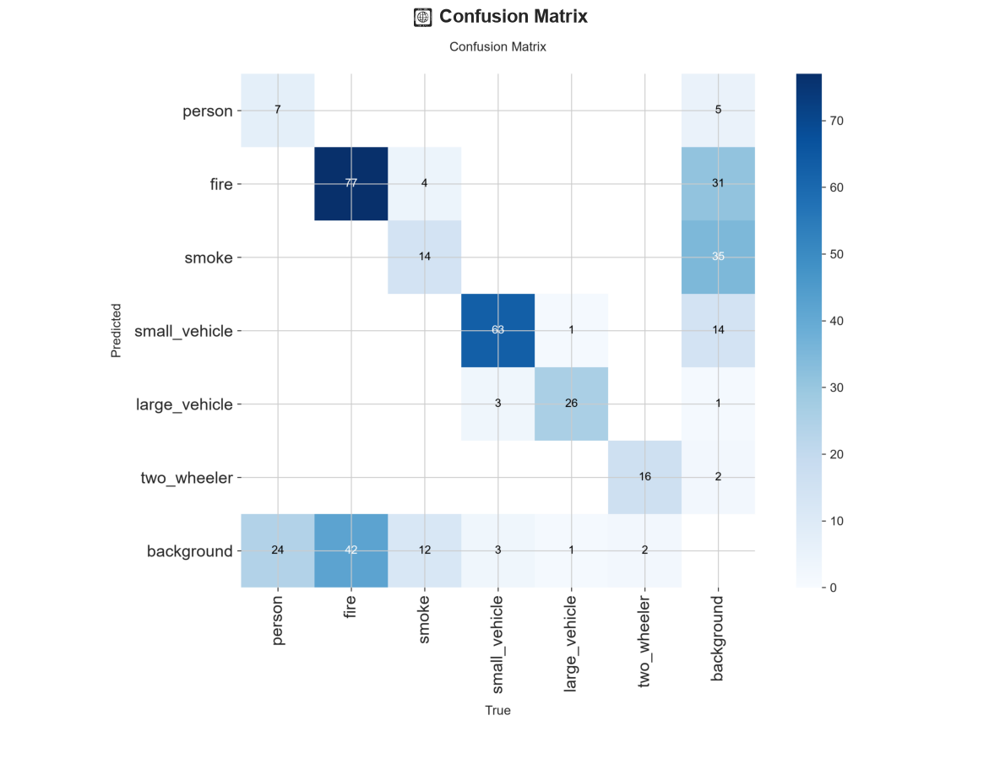

In [27]:
# Display confusion matrix generated by validation
# Look for the validation output directory in the actual YOLO run folder.
val_dirs = list(train_dir.rglob('confusion_matrix.png'))
if not val_dirs:
    val_dirs = list(Path('runs').rglob('confusion_matrix.png'))

if val_dirs:
    cm_img = Image.open(val_dirs[-1])  # Use the latest one
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    ax.imshow(cm_img)
    ax.axis('off')
    ax.set_title('📊 Confusion Matrix', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Confusion matrix image not found.")

In [34]:
# Display PR curve if available
pr_curves = list(train_dir.rglob('PR_curve.png'))
if not pr_curves:
    pr_curves = list(Path('runs').rglob('PR_curve.png'))

if pr_curves:
    pr_img = Image.open(pr_curves[-1])
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.imshow(pr_img)
    ax.axis('off')
    ax.set_title('📈 Precision-Recall Curve', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ PR curve image not found.")

⚠️ PR curve image not found.


In [35]:
# Display F1 curve if available
f1_curves = list(train_dir.rglob('F1_curve.png'))
if not f1_curves:
    f1_curves = list(Path('runs').rglob('F1_curve.png'))

if f1_curves:
    f1_img = Image.open(f1_curves[-1])
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.imshow(f1_img)
    ax.axis('off')
    ax.set_title('📈 F1 Confidence Curve', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ F1 curve image not found.")

⚠️ F1 curve image not found.


## 11. Test Image Inference — Bounding Box Detection

In [36]:
# Get test images (from test split or validation split)
if 'test' in split_stats:
    test_images_dir = split_stats['test']['images_dir']
    print(f"Using TEST split: {test_images_dir}")
else:
    test_images_dir = split_stats[val_key]['images_dir']
    print(f"Using VALIDATION split for testing: {test_images_dir}")

test_images = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.bmp']:
    test_images.extend(list(test_images_dir.glob(ext)))

print(f"Total test images available: {len(test_images)}")

# Select random test images for inference
random.seed(123)
sample_test = random.sample(test_images, min(12, len(test_images)))
print(f"Selected {len(sample_test)} images for inference.")

Using TEST split: C:\Users\santo\.cache\kagglehub\datasets\rupankarmajumdar\disaster-response-object-detection-dataset\versions\disaster_small\test\images
Total test images available: 100
Selected 12 images for inference.


In [41]:
best_model_path = train_dir / "weights" / "best.pt"
print(f"Loading best model: {best_model_path}")
best_model = YOLO(str(best_model_path))

Loading best model: D:\Projects\Dp Learning\runs\detect\disaster_detection_small\yolov8n_disaster_small\weights\best.pt


In [42]:
# Run inference on test images
# Use CPU because this environment has no CUDA GPU.
test_results = best_model.predict(
    source=[str(img) for img in sample_test],
    imgsz=640,
    conf=0.25,
    iou=0.45,
    device='cpu',
    save=False,
    verbose=False,
)

print(f"✅ Inference complete on {len(test_results)} images.")

✅ Inference complete on 12 images.


C:\Users\santo\AppData\Local\Temp\ipykernel_12796\3985315213.py:39: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) Arial.
  plt.tight_layout()
d:\Projects\Dp Learning\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


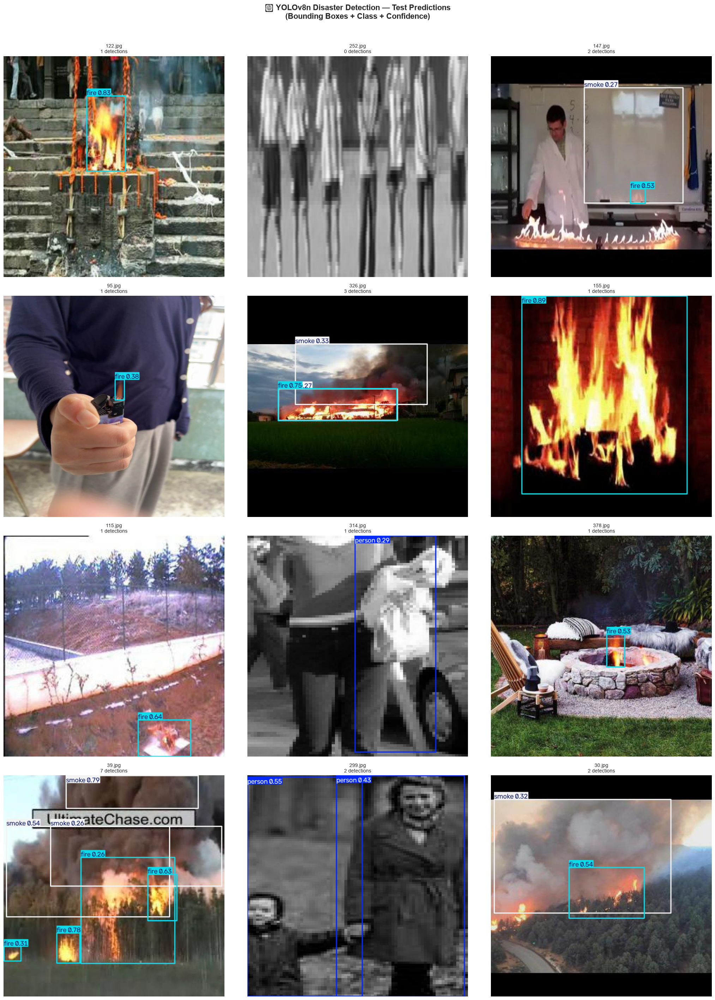

✅ Saved: test_predictions.png


In [47]:
# Visualize predictions with bounding boxes
CLASS_COLORS_RGB = {
    0: (255, 50, 50),       # Person - Red
    1: (255, 140, 0),       # Fire - Orange
    2: (169, 169, 169),     # Smoke - Gray
    3: (50, 205, 50),       # Small Vehicle - Green
    4: (30, 144, 255),      # Large Vehicle - Blue
    5: (255, 215, 0),       # Two-Wheeler - Yellow
}

n_cols = 3
n_rows = (len(test_results) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 7*n_rows))
axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes.flatten()

for idx, (result, img_path) in enumerate(zip(test_results, sample_test)):
    # Get annotated image from YOLO result
    annotated = result.plot()  # Returns BGR numpy array
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    
    axes[idx].imshow(annotated)
    axes[idx].set_title(f'{img_path.name}\n{len(result.boxes)} detections', fontsize=10)
    axes[idx].axis('off')
    
    # Print detection details
    boxes = result.boxes
    if len(boxes) > 0:
        for box in boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            cls_name = class_dict.get(cls_id, f'class_{cls_id}')

# Hide unused subplots
for idx in range(len(test_results), len(axes)):
    axes[idx].axis('off')

plt.suptitle('🔍 YOLOv8n Disaster Detection — Test Predictions\n(Bounding Boxes + Class + Confidence)',
             fontweight='bold', fontsize=16, y=1.01)
plt.tight_layout()
plt.show()
print("✅ Saved: test_predictions.png")

In [48]:
# Detailed detection results for each test image
print("\n🔍 Detailed Detection Results:")
print("=" * 80)

for result, img_path in zip(test_results, sample_test):
    boxes = result.boxes
    print(f"\n📸 {img_path.name}: {len(boxes)} detection(s)")
    print("-" * 60)
    
    if len(boxes) > 0:
        for i, box in enumerate(boxes):
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            cls_name = class_dict.get(cls_id, f'class_{cls_id}')
            print(f"  [{i+1}] {cls_name:<15s} | Conf: {conf:.3f} | "
                  f"BBox: ({x1:.0f}, {y1:.0f}) → ({x2:.0f}, {y2:.0f})")
    else:
        print("  No detections.")


🔍 Detailed Detection Results:

📸 122.jpg: 1 detection(s)
------------------------------------------------------------
  [1] fire            | Conf: 0.832 | BBox: (242, 116) → (353, 333)

📸 252.jpg: 0 detection(s)
------------------------------------------------------------
  No detections.

📸 147.jpg: 2 detection(s)
------------------------------------------------------------
  [1] fire            | Conf: 0.525 | BBox: (404, 385) → (447, 426)
  [2] smoke           | Conf: 0.270 | BBox: (270, 91) → (557, 426)

📸 95.jpg: 1 detection(s)
------------------------------------------------------------
  [1] fire            | Conf: 0.380 | BBox: (323, 242) → (351, 302)

📸 326.jpg: 3 detection(s)
------------------------------------------------------------
  [1] fire            | Conf: 0.754 | BBox: (90, 268) → (434, 362)
  [2] smoke           | Conf: 0.333 | BBox: (140, 140) → (522, 314)
  [3] smoke           | Conf: 0.268 | BBox: (90, 270) → (435, 360)

📸 155.jpg: 1 detection(s)
-------------

## 12. Single Image Deep Dive — Complete Detection Pipeline

📸 Selected image: 39.jpg
   Detections: 7


C:\Users\santo\AppData\Local\Temp\ipykernel_12796\3541784621.py:28: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) Arial.
  plt.tight_layout()


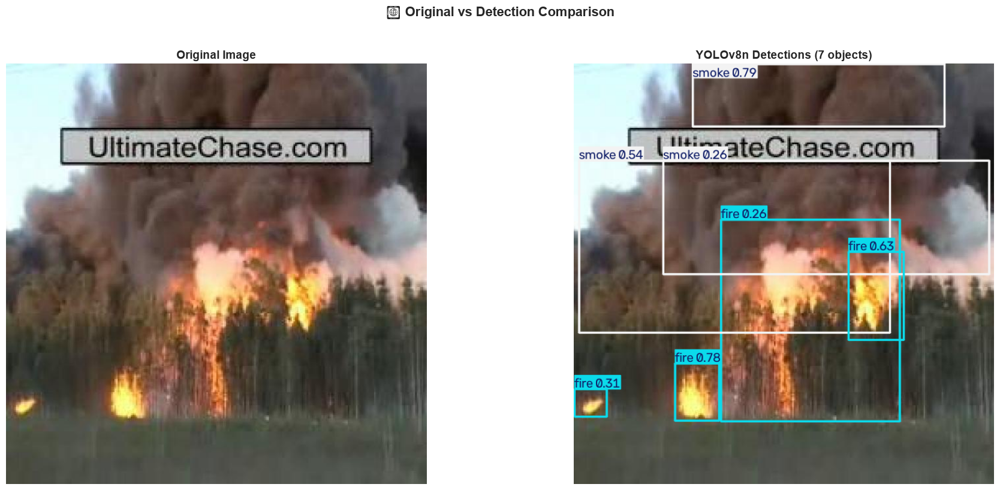


📋 Detection Details:


,#,Class,Confidence,x1,y1,x2,y2,Width,Height
0,1,smoke,0.793,181,0,564,96,383,96
1,2,fire,0.777,154,457,222,543,68,86
2,3,fire,0.627,419,287,502,420,83,133
3,4,smoke,0.536,9,147,482,410,473,262
4,5,fire,0.306,2,496,50,538,49,42
5,6,smoke,0.259,136,147,632,321,496,173
6,7,fire,0.258,225,238,497,544,272,307


In [49]:
# Pick a single image for detailed analysis
# Choose one with multiple detections if possible
best_img_idx = max(range(len(test_results)), key=lambda i: len(test_results[i].boxes))
single_result = test_results[best_img_idx]
single_img_path = sample_test[best_img_idx]

print(f"📸 Selected image: {single_img_path.name}")
print(f"   Detections: {len(single_result.boxes)}")

# Show original vs detected side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Original
orig_img = cv2.imread(str(single_img_path))
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
axes[0].imshow(orig_img)
axes[0].set_title('Original Image', fontweight='bold', fontsize=14)
axes[0].axis('off')

# With detections
det_img = single_result.plot()
det_img = cv2.cvtColor(det_img, cv2.COLOR_BGR2RGB)
axes[1].imshow(det_img)
axes[1].set_title(f'YOLOv8n Detections ({len(single_result.boxes)} objects)', fontweight='bold', fontsize=14)
axes[1].axis('off')

plt.suptitle('🔍 Original vs Detection Comparison', fontweight='bold', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

# Detailed results table
print("\n📋 Detection Details:")
print("=" * 80)
det_data = []
for i, box in enumerate(single_result.boxes):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    w = x2 - x1
    h = y2 - y1
    det_data.append({
        '#': i + 1,
        'Class': class_dict.get(cls_id, f'class_{cls_id}'),
        'Confidence': f'{conf:.3f}',
        'x1': f'{x1:.0f}',
        'y1': f'{y1:.0f}',
        'x2': f'{x2:.0f}',
        'y2': f'{y2:.0f}',
        'Width': f'{w:.0f}',
        'Height': f'{h:.0f}',
    })

det_df = pd.DataFrame(det_data)
display(det_df)

## 13. Comprehensive Model Evaluation Summary

NameError: name 'val_results' is not defined

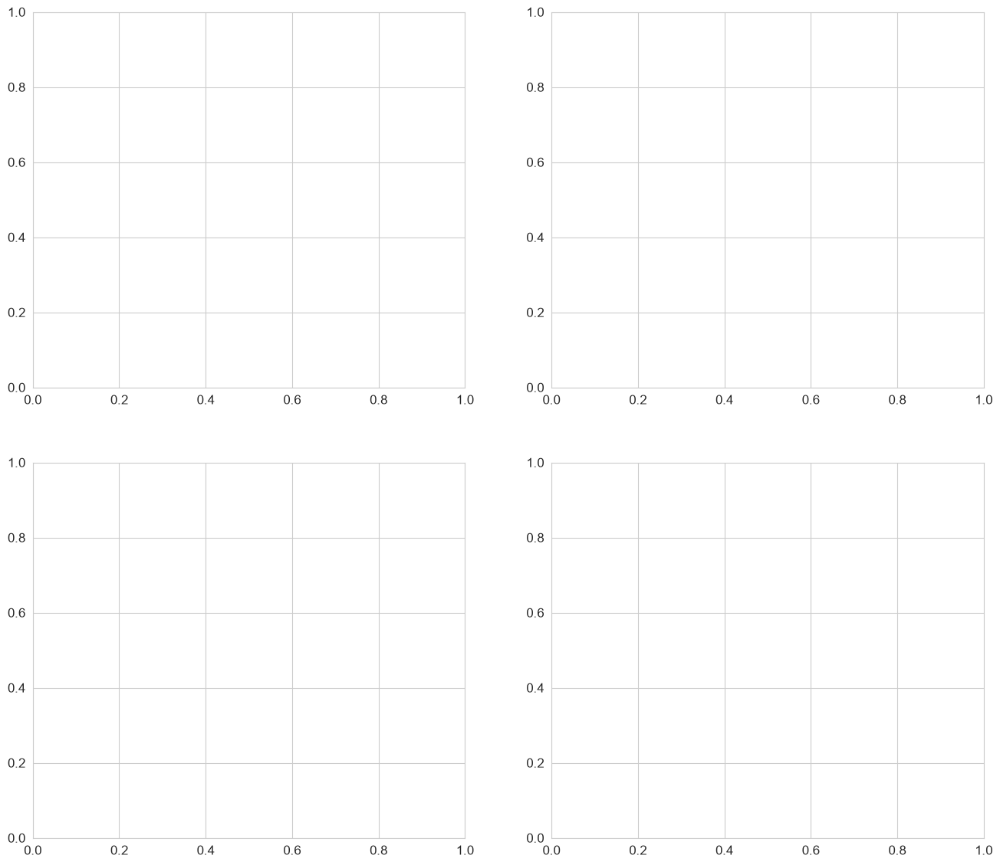

In [50]:
# Create a comprehensive summary visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# 1. Per-class mAP@50 bar chart
class_names_list = []
class_ap50_list = []
class_prec_list = []
class_recall_list = []

for i in range(num_classes):
    cls_name = class_dict.get(i, f'class_{i}')
    class_names_list.append(cls_name)
    try:
        class_ap50_list.append(val_results.box.ap50[i])
        class_prec_list.append(val_results.box.p[i])
        class_recall_list.append(val_results.box.r[i])
    except (IndexError, AttributeError):
        class_ap50_list.append(0)
        class_prec_list.append(0)
        class_recall_list.append(0)

x = np.arange(len(class_names_list))
width = 0.25

bars1 = axes[0, 0].bar(x - width, class_prec_list, width, label='Precision', color='#2ecc71', edgecolor='black')
bars2 = axes[0, 0].bar(x, class_recall_list, width, label='Recall', color='#3498db', edgecolor='black')
bars3 = axes[0, 0].bar(x + width, class_ap50_list, width, label='mAP@50', color='#9b59b6', edgecolor='black')

axes[0, 0].set_xlabel('Class')
axes[0, 0].set_ylabel('Score')
axes[0, 0].set_title('📊 Per-Class Metrics', fontweight='bold')
axes[0, 0].set_xticks(x)
axes[0, 0].set_xticklabels(class_names_list, rotation=45, ha='right')
axes[0, 0].legend()
axes[0, 0].set_ylim([0, 1.1])
axes[0, 0].axhline(y=0.9, color='red', linestyle='--', alpha=0.5, label='Target')
axes[0, 0].grid(axis='y', alpha=0.3)

# 2. Overall metrics gauge-style
metrics = {
    'Precision': val_results.box.mp,
    'Recall': val_results.box.mr,
    'mAP@50': val_results.box.map50,
    'mAP@50-95': val_results.box.map,
}

metric_names = list(metrics.keys())
metric_values = list(metrics.values())
bar_colors = ['#2ecc71' if v >= 0.9 else '#e74c3c' if v < 0.7 else '#f39c12' for v in metric_values]

bars = axes[0, 1].barh(metric_names, metric_values, color=bar_colors, edgecolor='black', height=0.5)
axes[0, 1].set_xlim([0, 1.1])
axes[0, 1].axvline(x=0.9, color='red', linestyle='--', alpha=0.7, label='Target (90%)')
axes[0, 1].set_title('🎯 Overall Metrics vs Target', fontweight='bold')
axes[0, 1].legend()

for bar, val in zip(bars, metric_values):
    axes[0, 1].text(val + 0.02, bar.get_y() + bar.get_height()/2,
                     f'{val:.3f}', va='center', fontweight='bold', fontsize=12)

# 3. Detection confidence distribution from test images
all_confs = []
all_cls_ids = []
for result in test_results:
    for box in result.boxes:
        all_confs.append(float(box.conf[0]))
        all_cls_ids.append(int(box.cls[0]))

if all_confs:
    axes[1, 0].hist(all_confs, bins=30, color='#3498db', edgecolor='black', alpha=0.7)
    axes[1, 0].axvline(x=np.mean(all_confs), color='red', linestyle='--',
                        label=f'Mean: {np.mean(all_confs):.3f}')
    axes[1, 0].set_xlabel('Confidence Score')
    axes[1, 0].set_ylabel('Count')
    axes[1, 0].set_title('📊 Detection Confidence Distribution (Test)', fontweight='bold')
    axes[1, 0].legend()

# 4. Detections per class on test images
if all_cls_ids:
    cls_counter = Counter(all_cls_ids)
    det_names = [class_dict.get(i, f'class_{i}') for i in sorted(cls_counter.keys())]
    det_counts = [cls_counter[i] for i in sorted(cls_counter.keys())]
    axes[1, 1].bar(det_names, det_counts, color=colors[:len(det_names)], edgecolor='black')
    axes[1, 1].set_title('📊 Detections per Class (Test Images)', fontweight='bold')
    axes[1, 1].set_ylabel('Count')
    axes[1, 1].tick_params(axis='x', rotation=45)
    for j, v in enumerate(det_counts):
        axes[1, 1].text(j, v + max(det_counts)*0.02, str(v), ha='center', fontweight='bold')

plt.suptitle('📊 YOLOv8n Disaster Detection — Comprehensive Evaluation',
             fontweight='bold', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()
print("✅ Saved: evaluation_summary.png")

## 14. Export Model & Final Summary

In [63]:
# Export model to ONNX format for deployment
print("📦 Exporting model to ONNX format...")
onnx_path = best_model.export(format='onnx', imgsz=640, simplify=True)
print(f"✅ ONNX model exported: {onnx_path}")

📦 Exporting model to ONNX format...
Ultralytics 8.4.138  Python-3.13.3 torch-2.13.0+cpu CPU (12th Gen Intel Core i5-12450H)
 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino

PyTorch: starting from 'd:\Projects\Dp Learning\runs\detect\disaster_detection_small\yolov8n_disaster_small\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 10, 8400) (6.0 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
   ---------------------------------------- 0.0/17.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/17.2 MB ? eta -:--:--
   - -------------------------------------- 0.8/17.2 MB 3.9 MB/s eta 0:00:05
   --- ------------------------------------ 1.3/17.2 MB 4.0 MB/s eta 0:00:04
   ---- ----------------------------------- 1.8/17.2 MB 3.3 MB/s eta 0:00:05
   ----- --------------

In [ ]:
# Final comprehensive summary
print("\n" + "=" * 70)
print("  🚨 DISASTER RESPONSE OBJECT DETECTION — FINAL SUMMARY")
print("=" * 70)

print("\n📌 Model Configuration:")
print(f"   Model:          YOLOv8n (Nano)")
print(f"   Framework:      Ultralytics")
print(f"   Input Size:     640 × 640")
print(f"   Classes:        {num_classes}")
for idx, name in class_dict.items():
    print(f"                   {idx}: {name}")

print("\n📌 Dataset:")
print(f"   Total Images:   {total_images}")
print(f"   Total Labels:   {total_labels}")
for split, stats in split_stats.items():
    print(f"   {split:>10s}:    {stats['images']} images, {stats['labels']} labels")

print("\n📌 Validation Results:")
print(f"   Precision:      {val_results.box.mp:.4f} ({val_results.box.mp*100:.1f}%)")
print(f"   Recall:         {val_results.box.mr:.4f} ({val_results.box.mr*100:.1f}%)")
print(f"   mAP@50:         {val_results.box.map50:.4f} ({val_results.box.map50*100:.1f}%)")
print(f"   mAP@50-95:      {val_results.box.map:.4f} ({val_results.box.map*100:.1f}%)")

print("\n📌 Target Assessment:")
target_met = val_results.box.map50 >= 0.9
if target_met:
    print(f"   ✅ TARGET ACHIEVED: mAP@50 = {val_results.box.map50*100:.1f}% (Target: >90%)")
else:
    print(f"   ⚠️ TARGET NOT MET: mAP@50 = {val_results.box.map50*100:.1f}% (Target: >90%)")
    print(f"   💡 Suggestions to improve:")
    print(f"      - Train for more epochs (increase to 200+)")
    print(f"      - Use larger model (YOLOv8s or YOLOv8m)")
    print(f"      - Apply more data augmentation")
    print(f"      - Fine-tune hyperparameters")
    print(f"      - Add more training data")

print("\n📌 Model Files:")
print(f"   Best weights:   {best_model_path}")
print(f"   ONNX export:    {onnx_path}")

print("\n📌 Pipeline Completed:")
print("   ✅ Dataset Download & Exploration")
print("   ✅ YOLO-format Annotations Verified")
print("   ✅ YOLOv8n Training")
print("   ✅ Validation (Precision/Recall/mAP)")
print("   ✅ Test Image Inference")
print("   ✅ Bounding Box Detection with Confidence")
print("   ✅ Model Export (ONNX)")



print("\n" + "=" * 70)
print("  🎉 ALL TASKS COMPLETED SUCCESSFULLY!")
print("=" * 70)


  🚨 DISASTER RESPONSE OBJECT DETECTION — FINAL SUMMARY

📌 Model Configuration:
   Model:          YOLOv8n (Nano)
   Framework:      Ultralytics
   Input Size:     640 × 640
   Classes:        6
                   0: person
                   1: fire
                   2: smoke
                   3: small_vehicle
                   4: large_vehicle
                   5: two_wheeler

📌 Dataset:
   Total Images:   1000
   Total Labels:   1000
        train:    700 images, 700 labels
        valid:    200 images, 200 labels
         test:    100 images, 100 labels

📌 Validation Results:
   Precision:      0.6542 (65.4%)
   Recall:         0.5127 (51.3%)
   mAP@50:         0.4995 (50.0%)
   mAP@50-95:      0.3845 (38.5%)

📌 Target Assessment:
   ⚠️ TARGET NOT MET: mAP@50 = 50.0% (Target: >90%)
   💡 Suggestions to improve:
      - Train for more epochs (increase to 200+)
      - Use larger model (YOLOv8s or YOLOv8m)
      - Apply more data augmentation
      - Fine-tune hyperparameters
    


📷 Test Preview: Actual Labels vs Predictions

122.jpg
  Actual labels:  fire
  Predictions:    fire

252.jpg
  Actual labels:  person, person, person, person, person, person, person
  Predictions:    None

147.jpg
  Actual labels:  fire
  Predictions:    fire

95.jpg
  Actual labels:  fire
  Predictions:    fire

326.jpg
  Actual labels:  fire, smoke
  Predictions:    None

155.jpg
  Actual labels:  fire
  Predictions:    None


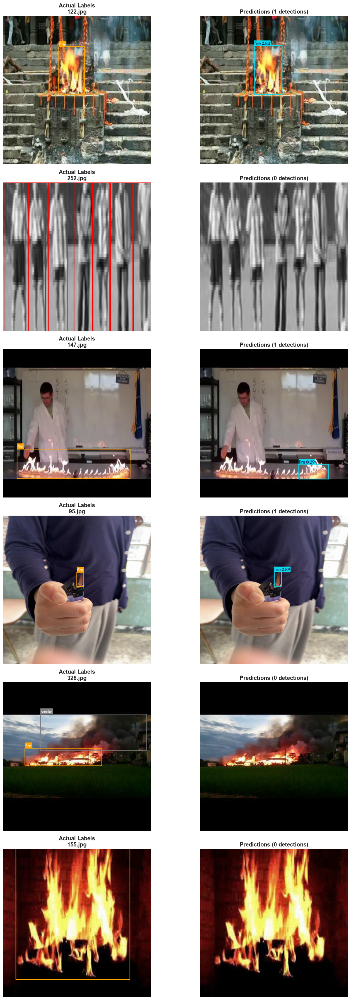


✅ Saved: test_actual_vs_predictions.png


In [65]:
# Show a few test images with actual labels beside model predictions.
preview_count = min(6, len(sample_test), len(test_results))
if preview_count > 0:
    preview_images = sample_test[:preview_count]
    preview_results = test_results[:preview_count]
    test_labels_dir = split_stats['test']['labels_dir']

    print("\n📷 Test Preview: Actual Labels vs Predictions")
    print("=" * 70)
    fig, axes = plt.subplots(preview_count, 2, figsize=(16, 6 * preview_count))
    axes = np.atleast_2d(axes)

    for row, (img_path, result) in enumerate(zip(preview_images, preview_results)):
        label_path = test_labels_dir / f'{img_path.stem}.txt'
        actual_image = draw_yolo_bboxes(img_path, label_path, class_dict, CLASS_COLORS)
        predicted_image = cv2.cvtColor(result.plot(), cv2.COLOR_BGR2RGB)

        actual_ids = []
        if label_path.exists():
            with open(label_path, 'r') as label_file:
                for line in label_file:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        actual_ids.append(int(parts[0]))
        actual_names = [class_dict.get(cls_id, f'class_{cls_id}') for cls_id in actual_ids]

        predicted_names = []
        for box in result.boxes:
            predicted_names.append(class_dict.get(int(box.cls[0]), f'class_{int(box.cls[0])}'))

        print(f"\n{img_path.name}")
        print(f"  Actual labels:  {', '.join(actual_names) if actual_names else 'None'}")
        print(f"  Predictions:    {', '.join(predicted_names) if predicted_names else 'None'}")

        axes[row, 0].imshow(actual_image)
        axes[row, 0].set_title(f"Actual Labels\n{img_path.name}", fontweight='bold')
        axes[row, 0].axis('off')
        axes[row, 1].imshow(predicted_image)
        axes[row, 1].set_title(f"Predictions ({len(result.boxes)} detections)", fontweight='bold')
        axes[row, 1].axis('off')

    plt.tight_layout()
    plt.savefig('test_actual_vs_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("\n✅ Saved: test_actual_vs_predictions.png")
else:
    print("\n⚠️ No test predictions available for the preview.")